### Import Modules

In [ ]:
!pip install thop

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
import torchvision.models as models
import urllib.request
import os
import numpy as np
import tarfile
import shutil
import glob
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
import cv2 as cv
import matplotlib.pyplot as plt
import torchvision.models as models
import torch.optim as optim
from PIL import Image
from thop import profile
import time
%matplotlib inline

### Load Data

In [ ]:
url='http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar'
path='VOC'

In [ ]:
def get_archive(path,url):
    os.makedirs(path, exist_ok=True)
    filename='devkit'
    urllib.request.urlretrieve(url,f"{path}/{filename}.tar")

get_archive(path,url)

def extract(path):
    tar_file=tarfile.open(f"{path}/devkit.tar")
    tar_file.extractall('./')
    tar_file.close()
    shutil.rmtree(path)

extract(path)

In [ ]:
VOC_COLORMAP = np.array([
    [0, 0, 0], [128, 0, 0], [0, 128, 0], [128, 128, 0],
    [0, 0, 128], [128, 0, 128], [0, 128, 128], [128, 128, 128],
    [64, 0, 0], [192, 0, 0], [64, 128, 0], [192, 128, 0],
    [64, 0, 128], [192, 0, 128], [64, 128, 128], [192, 128, 128],
    [0, 64, 0], [128, 64, 0], [0, 192, 0], [128, 192, 0], [0, 64, 128]
], dtype=np.uint8)

In [ ]:
class VocDataset(Dataset):
    def __init__(self, dir, color_map):
        self.root=os.path.join(dir, 'VOCdevkit/VOC2012')
        self.target_dir=os.path.join(self.root, 'SegmentationClass')
        self.images_dir=os.path.join(self.root, 'JPEGImages')
        file_list=os.path.join(self.root, 'ImageSets/Segmentation/trainval.txt')
        self.files = [line.rstrip() for line in open(file_list, "r")]
        self.color_map=color_map

    def convert_to_segmentation_mask(self, mask):
        height, width = mask.shape[:2]
        label_mask = np.zeros((height, width), dtype=np.int32)

        for label_index, label in enumerate(self.color_map):
            label_mask[np.all(mask == label, axis=-1)] = label_index

        return label_mask

    def __getitem__(self, index):
        image_id = self.files[index]
        image_path = os.path.join(self.images_dir, f"{image_id}.jpg")
        label_path = os.path.join(self.target_dir, f"{image_id}.png")

        image = cv.imread(image_path)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        image = cv.resize(image, (256, 256))
        image = torch.tensor(image).permute(2, 0, 1).float()

        label = cv.imread(label_path)
        label = cv.cvtColor(label, cv.COLOR_BGR2RGB)
        label = cv.resize(label, (256, 256))
        label = self.convert_to_segmentation_mask(label)
        label = torch.tensor(label).long()

        return image, label

    def __len__(self):
        return len(self.files)

In [ ]:
data = VocDataset('/content', VOC_COLORMAP)
train_size = int(len(data) * 0.8)
test_size = len(data) - train_size
train_set, test_set = torch.utils.data.random_split(data, [train_size, test_size])

train_size = int(len(train_set) * 0.9)
val_size = len(train_set) - train_size
train_set, val_set = torch.utils.data.random_split(train_set, [train_size, val_size])

train_loader = DataLoader(train_set, batch_size=10, shuffle=True)
val_loader = DataLoader(val_set, batch_size=10, shuffle=False)
test_loader = DataLoader(test_set, batch_size=10, shuffle=False)

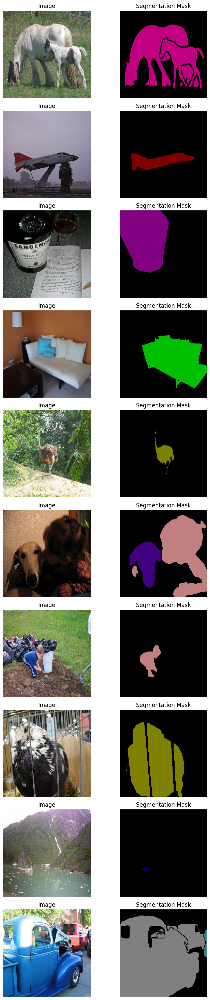

In [ ]:
def decode_segmentation_mask(mask, color_map):
    """Converts class index segmentation mask to RGB mask."""
    height, width = mask.shape
    rgb_mask = np.zeros((height, width, 3), dtype=np.uint8)

    for label_index, color in enumerate(color_map):
        rgb_mask[mask == label_index] = color

    return rgb_mask

def visualize_sample(data_loader, color_map, num_samples=5):
    """Visualizes images and corresponding segmentation masks from the data loader."""
    data_iter = iter(data_loader)
    images, masks = next(data_iter)

    fig, axes = plt.subplots(num_samples, 2, figsize=(8, num_samples * 3))

    for i in range(num_samples):
        img = images[i].permute(1, 2, 0).numpy().astype(np.uint8)
        mask = masks[i].numpy()
        mask_rgb = decode_segmentation_mask(mask, color_map)

        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(mask_rgb)
        axes[i, 1].set_title("Segmentation Mask")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

visualize_sample(train_loader, VOC_COLORMAP, num_samples=10)

### SegNet with VGG16 Backbone

In [ ]:
class SegNetBackboneVGG(nn.Module):
    def __init__(self, num_classes=21):
        super(SegNetBackboneVGG, self).__init__()
        vgg16_bn = models.vgg16_bn(pretrained=True)

        self.encoder = nn.Sequential(*list(vgg16_bn.features.children())[:34])

        self.decoder = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(64, num_classes, kernel_size=3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

### SegNet with EfficientNet-B0 Backbone

In [ ]:
class SegNetEfficientNet(nn.Module):
    def __init__(self, num_classes=21):
        super(SegNetEfficientNet, self).__init__()
        efficientnet = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
        self.encoder = efficientnet.features

        self.decoder = nn.Sequential(
            nn.Conv2d(1280, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),

            nn.Conv2d(64, num_classes, kernel_size=3, padding=1),
            nn.Upsample(size=(256, 256), mode='bilinear', align_corners=True)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

### Training, Validation and Evaluation Function

In [ ]:
def train_model(model, train_loader, val_loader, num_epochs=20, learning_rate=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=255)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_pixels, total_pixels = 0, 0

        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            correct_pixels += (preds == masks).sum().item()
            total_pixels += masks.numel()

        train_loss = running_loss / len(train_loader)
        train_accuracy = correct_pixels / total_pixels
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)

        model.eval()
        val_loss = sum(criterion(model(images.to(device)), masks.to(device)).item() for images, masks in val_loader) / len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Pixel Accuracy: {train_accuracy:.4f}")

    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    input_tensor = torch.randn(1, 3, 256, 256).to(device)
    macs, params = profile(model, inputs=(input_tensor,), verbose=False)
    flops = 2 * macs

    results = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accuracies": train_accuracies,
        "val_accuracies": val_accuracies,
        "params": params,
        "macs": macs,
        "flops": flops,
    }
    return results

In [ ]:
def mean_iou(preds, targets, num_classes=21):
    ious = []
    preds = preds.cpu().numpy()
    targets = targets.cpu().numpy()
    for cls in range(num_classes):
        pred_inds = (preds == cls)
        target_inds = (targets == cls)
        intersection = np.logical_and(pred_inds, target_inds).sum()
        union = np.logical_or(pred_inds, target_inds).sum()
        if union == 0:
            ious.append(float('nan'))
        else:
            ious.append(intersection / union)
    return np.nanmean(ious)

def dice_score(preds, targets):
    preds = preds.cpu().numpy()
    targets = targets.cpu().numpy()
    intersection = np.logical_and(preds, targets).sum()
    return (2. * intersection) / (preds.sum() + targets.sum() + 1e-6)

def jaccard_index(preds, targets):
    preds = preds.cpu().numpy()
    targets = targets.cpu().numpy()
    intersection = np.logical_and(preds, targets).sum()
    union = np.logical_or(preds, targets).sum()
    return intersection / (union + 1e-6)

def pixel_accuracy(preds, targets):
    preds = preds.cpu().numpy()
    targets = targets.cpu().numpy()
    correct = (preds == targets).sum()
    total = targets.size
    return correct / total

In [ ]:
def evaluate_model(model, test_loader, num_classes=21):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    total_iou, total_dice, total_jaccard, total_acc = [], [], [], []

    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            iou = mean_iou(preds.cpu(), masks.cpu(), num_classes)
            dice = dice_score(preds.cpu(), masks.cpu())
            jaccard = jaccard_index(preds.cpu(), masks.cpu())
            acc = pixel_accuracy(preds.cpu(), masks.cpu())

            total_iou.append(iou)
            total_dice.append(dice)
            total_jaccard.append(jaccard)
            total_acc.append(acc)

    print(f"Mean IoU: {np.nanmean(total_iou):.4f}")
    print(f"Dice Score: {np.mean(total_dice):.4f}")
    print(f"Jaccard Index: {np.mean(total_jaccard):.4f}")
    print(f"Pixel Accuracy: {np.mean(total_acc):.4f}")

In [ ]:
def visualize_predictions(model, data_loader, color_map, num_samples=20):
    """Visualizes model predictions on test set."""
    model.eval()

    images_list, masks_list, predictions_list = [], [], []

    for images, masks in data_loader:
        images = images.to(next(model.parameters()).device)

        with torch.no_grad():
            outputs = model(images)
            predictions = torch.argmax(outputs, dim=1).cpu().numpy()

        images_list.append(images.cpu())
        masks_list.append(masks.cpu())
        predictions_list.append(predictions)

        if sum(img.shape[0] for img in images_list) >= num_samples:
            break

    images = torch.cat(images_list, dim=0)
    masks = torch.cat(masks_list, dim=0)
    predictions = np.concatenate(predictions_list, axis=0)

    num_samples = min(num_samples, images.shape[0])

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 3))

    for i in range(num_samples):
        img = images[i].permute(1, 2, 0).numpy()
        mask_rgb = decode_segmentation_mask(masks[i].numpy(), color_map)
        pred_rgb = decode_segmentation_mask(predictions[i], color_map)

        axes[i, 0].imshow(img.astype(np.uint8))
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(mask_rgb)
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(pred_rgb)
        axes[i, 2].set_title("Prediction")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

### Compare Models

##### SegNet with VGG backbone

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:03<00:00, 159MB/s]


Epoch [1/20], Train Loss: 1.2290, Val Loss: 1.3845, Pixel Accuracy: 0.7451
Epoch [2/20], Train Loss: 1.0659, Val Loss: 1.0350, Pixel Accuracy: 0.7529
Epoch [3/20], Train Loss: 1.0305, Val Loss: 1.0567, Pixel Accuracy: 0.7530
Epoch [4/20], Train Loss: 0.9835, Val Loss: 0.9990, Pixel Accuracy: 0.7568
Epoch [5/20], Train Loss: 0.9460, Val Loss: 0.9497, Pixel Accuracy: 0.7602
Epoch [6/20], Train Loss: 0.9227, Val Loss: 0.9784, Pixel Accuracy: 0.7660
Epoch [7/20], Train Loss: 0.8901, Val Loss: 0.8682, Pixel Accuracy: 0.7678
Epoch [8/20], Train Loss: 0.8778, Val Loss: 0.8788, Pixel Accuracy: 0.7703
Epoch [9/20], Train Loss: 0.8533, Val Loss: 0.8931, Pixel Accuracy: 0.7742
Epoch [10/20], Train Loss: 0.8406, Val Loss: 0.8701, Pixel Accuracy: 0.7777
Epoch [11/20], Train Loss: 0.8334, Val Loss: 0.8280, Pixel Accuracy: 0.7772
Epoch [12/20], Train Loss: 0.8156, Val Loss: 0.8354, Pixel Accuracy: 0.7802
Epoch [13/20], Train Loss: 0.7750, Val Loss: 0.8495, Pixel Accuracy: 0.7873
Epoch [14/20], Train 

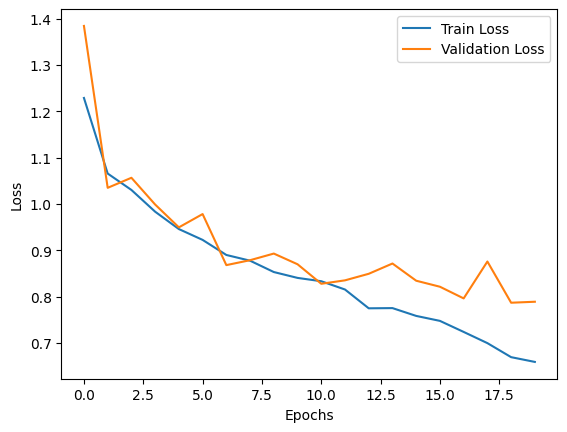

In [ ]:
# train and save model
modelVGG = SegNetBackboneVGG()
results = train_model(modelVGG, train_loader, val_loader)
torch.save(modelVGG.state_dict(), f"SegNetVGG.pth")

In [ ]:
print("Model Summary SegNet with VGG16 Backbone")
print(summary(modelVGG, (3, 256, 256)))

Model Summary SegNet with VGG16 Backbone
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7         [-1, 64, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               

In [ ]:
for name, result in results.items():
    print(name,"-", result)

train_losses - [1.2290002468086425, 1.0658736822151003, 1.0304504458393369, 0.9835104576178959, 0.9460173933278947, 0.9226647192523593, 0.8901246661231631, 0.8777757136594682, 0.8532853932607741, 0.8406280483518328, 0.8334315089952378, 0.8155501724708648, 0.7749944259723027, 0.775451068225361, 0.7585861119486037, 0.7478580051944369, 0.7240243158170155, 0.6998594032866614, 0.6695609816483089, 0.6592874947048369]
val_losses - [1.3844617009162903, 1.035029299557209, 1.056734211742878, 0.999000146985054, 0.949716774125894, 0.9783960233132044, 0.8682159644862016, 0.8788440550367037, 0.8931499943137169, 0.8700812968115011, 0.8279550820589066, 0.8353557586669922, 0.8495029397308826, 0.8716756242016951, 0.8345431499183178, 0.8215589548150698, 0.7963724384705225, 0.8759836194415888, 0.7870416802664598, 0.7891765758395195]
train_accuracies - [0.7450685369212342, 0.7529269515416369, 0.7529838536544021, 0.7567663088149551, 0.7602472773721574, 0.7660332908503033, 0.7678286325493823, 0.7702964160575

In [ ]:
evaluate_model(modelVGG, test_loader)

Mean IoU: 0.1522
Dice Score: 0.0642
Jaccard Index: 0.5188
Pixel Accuracy: 0.7915


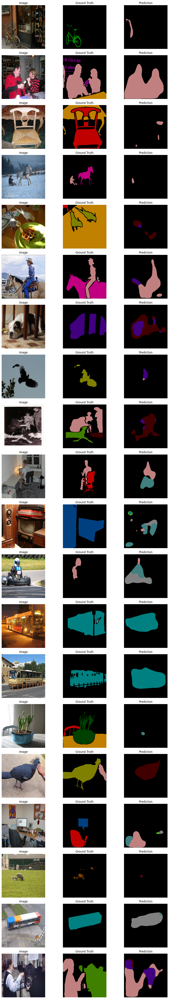

In [ ]:
visualize_predictions(modelVGG, test_loader, VOC_COLORMAP)

##### SegNet with EfficientNet-B0 backbone

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 166MB/s]


Epoch [1/20], Train Loss: 0.9292, Val Loss: 0.8214, Pixel Accuracy: 0.7628
Epoch [2/20], Train Loss: 0.7427, Val Loss: 0.7376, Pixel Accuracy: 0.7877
Epoch [3/20], Train Loss: 0.6696, Val Loss: 0.6665, Pixel Accuracy: 0.8047
Epoch [4/20], Train Loss: 0.5969, Val Loss: 0.5578, Pixel Accuracy: 0.8203
Epoch [5/20], Train Loss: 0.5232, Val Loss: 0.6309, Pixel Accuracy: 0.8395
Epoch [6/20], Train Loss: 0.4854, Val Loss: 0.5906, Pixel Accuracy: 0.8468
Epoch [7/20], Train Loss: 0.4743, Val Loss: 0.5774, Pixel Accuracy: 0.8535
Epoch [8/20], Train Loss: 0.4365, Val Loss: 0.6023, Pixel Accuracy: 0.8641
Epoch [9/20], Train Loss: 0.3905, Val Loss: 0.5017, Pixel Accuracy: 0.8765
Epoch [10/20], Train Loss: 0.3795, Val Loss: 0.5093, Pixel Accuracy: 0.8803
Epoch [11/20], Train Loss: 0.3486, Val Loss: 0.5999, Pixel Accuracy: 0.8873
Epoch [12/20], Train Loss: 0.3107, Val Loss: 0.5234, Pixel Accuracy: 0.8966
Epoch [13/20], Train Loss: 0.3106, Val Loss: 0.5445, Pixel Accuracy: 0.8964
Epoch [14/20], Train 

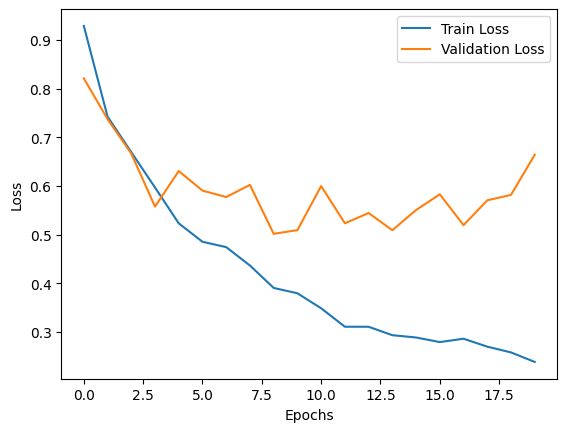

In [ ]:
# train and save model
modelEfficientNet = SegNetEfficientNet()
results = train_model(modelEfficientNet, train_loader, val_loader)
torch.save(modelEfficientNet.state_dict(), f"SegNetEfficientNet.pth")

In [ ]:
print("Model Summary SegNet with EfficientNet-B0 Backbone")
print(summary(modelEfficientNet, (3, 256, 256)))

Model Summary SegNet with EfficientNet-B0 Backbone
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             864
       BatchNorm2d-2         [-1, 32, 128, 128]              64
              SiLU-3         [-1, 32, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]             288
       BatchNorm2d-5         [-1, 32, 128, 128]              64
              SiLU-6         [-1, 32, 128, 128]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12         [-1, 32, 128, 128]               0
           Conv2d-13         [-1, 16, 128, 128]     

In [ ]:
for name, result in results.items():
    print(name,"-", result)

train_losses - [0.9291901144243422, 0.7427485417752039, 0.6696181240535918, 0.5969257051036472, 0.5232381624834878, 0.48536906916470757, 0.4743108604635511, 0.43653844609147024, 0.3904626856247584, 0.3794696407658713, 0.3486279691259066, 0.3107027002743312, 0.31060897296383266, 0.2932855745156606, 0.28858262108904975, 0.279100990437326, 0.28602535809789387, 0.2697019098060472, 0.2578610027475016, 0.2383277790177436]
val_losses - [0.82142440478007, 0.7375730772813162, 0.6665446596841017, 0.5577742966512839, 0.6308719851076603, 0.5905800797045231, 0.5773536823689938, 0.6022919652362665, 0.5017220055063566, 0.5093405749648809, 0.5999257105092207, 0.5234020048131546, 0.5444565235326687, 0.5090843333552281, 0.5506918064008156, 0.5829721937576929, 0.5194941045095524, 0.5706253877530495, 0.5817225513358911, 0.6643384123841921]
train_accuracies - [0.7627900523348087, 0.7876913337179975, 0.8047318210701858, 0.8203411111390528, 0.8395474297010052, 0.8468123814806122, 0.853450282164625, 0.8640942

In [ ]:
evaluate_model(modelEfficientNet, test_loader)

Mean IoU: 0.2985
Dice Score: 0.0725
Jaccard Index: 0.5878
Pixel Accuracy: 0.8328


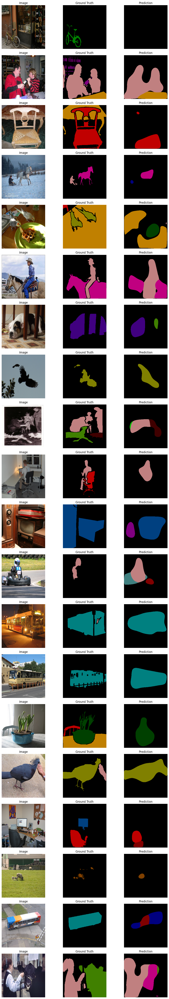

In [ ]:
visualize_predictions(modelEfficientNet, test_loader, VOC_COLORMAP)

|  | SegNet with VGG16 Backbone | SegNet with VGG16 Backbone |
|----------|----------|----------|
| Parameters  | 17,650,965  | 11,469,073  |
| MACs | 27B  | 2.06B |
| FLOPs | 54B  | 4.12B |
|Mean IoU| 0.1522|0.2985|
|Dice Score| 0.0642|0.0725|
|Jaccard Index| 0.5188|0.5878|
|Pixel Accuracy| 0.7915|0.8328|

```
SegNet with Efficient Net Backbone:
* is significantly smaller (~35% reduction)
* is much more computationally efficient (MACs, FLOPs) (~92% reduction)
* shows significant improvement in segmentation quality (Mean IoU)
* slight improvement in segmentation overlap (Dice Score)
* indicates better region matching between prediction and ground truth (Jaccard Index)
* shows overall better classification of pixels (Pixel Accuracy)
It performs better in all segmentation metrics while being much smaller and computationally cheaper
